# Noise Correlations Analysis Pipeline

How do neurons interact with one another beyond their individual tuning?

## 1. Imports and general setup


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.mixture import GaussianMixture
from pathlib import Path
from scipy import stats
import warnings, traceback
warnings.filterwarnings('ignore')
print('Successfully loaded.')

Successfully loaded.


In [2]:
# ─── PATHS ────────────────────────────────────────────────────────────────────
DATA_ROOT = r'D:\AL-205\Nicole\Calcio\Nueva_carpeta'  

# Keywords for detecting files (case-insensitive, searches for substring in name)
SCOPE_KEYWORD  = 'reg'     # microscope time flags data
STIM_KEYWORD   = 'pas'     # stim data
TRACES_KEYWORD = 'traces'  # calcium traces .csv

# Group folder → genotype
GENOTYPE_FOLDERS = {
    'BTBR': 'BTBR',
    'C57':  'C57',
}

# ─── ADQUISITION ──────────────────────────────────────────────────────────────
SAMPLING_RATE = 5           # Hz
MS_PER_FRAME  = 1000 / SAMPLING_RATE  # 200 ms

# ─── STIM WINDOWS ─────────────────────────────────────────────────────────────
SEC_BEFORE    = 2
SEC_AFTER     = 4
FRAMES_BEFORE = int(SEC_BEFORE * SAMPLING_RATE)   # 10
FRAMES_AFTER  = int(SEC_AFTER  * SAMPLING_RATE)   # 20
TOTAL_FRAMES  = FRAMES_BEFORE + FRAMES_AFTER       # 30

# Response window for population analysis (during the stimulus)
RESP_START = FRAMES_BEFORE      # frame 10
RESP_END   = TOTAL_FRAMES       # frame 30

# ─── THRESHOLDS ─────────────────────────────────────────────────────────────────
RESPONSIVE_STD   = 3    # STDs sobre baseline para neurona responsiva
OSI_THRESH       = 0.7  # OSI mínimo para neurona selectiva

# ─── OUTPUT ───────────────────────────────────────────────────────────────────
OUTPUT_DIR = Path(DATA_ROOT) / 'pipeline_output_real'
OUTPUT_DIR.mkdir(exist_ok=True)

print('Setup loaded.')
print(f'Output → {OUTPUT_DIR}')

Setup loaded.
Output → D:\AL-205\Nicole\Calcio\Nueva_carpeta\pipeline_output_real


In [3]:
#Find files
def find_file(folder: Path, keyword: str) -> Path:
    """Finds the first file whose name contains keyword (case-insensitive).
    Excludes files that also contain other keywords, to avoid the
    traces CSV being detected as the stimulus TXT."""
    kw = keyword.lower()
    matches = [f for f in folder.iterdir()
               if f.is_file() and kw in f.name.lower()]
    if not matches:
        raise FileNotFoundError(
            f"No file found with '{keyword}' in {folder}")
    # If there are several, prefer TXT over CSV for log/stimulus keywords
    txt_matches = [f for f in matches if f.suffix.lower() == '.txt']
    csv_matches = [f for f in matches if f.suffix.lower() == '.csv']
    if kw in ['reg', 'pas']:
        return txt_matches[0] if txt_matches else matches[0]
    else:  # traces → prefer CSV
        return csv_matches[0] if csv_matches else matches[0]


def detect_genotype(group_name: str) -> str:
    for kw, geno in GENOTYPE_FOLDERS.items():
        if kw.upper() in group_name.upper():
            return geno
    return 'Unknown'


def discover_subjects(root: str) -> list:
    """Walks two levels: group/subject."""
    root = Path(root)
    subjects = []
    for group in sorted(root.iterdir()):
        if not group.is_dir() or group.name.startswith('.') \
                or group.name == 'pipeline_output':
            continue
        genotype = detect_genotype(group.name)
        for subject in sorted(group.iterdir()):
            if not subject.is_dir() or subject.name.startswith('.'):
                continue
            subjects.append({
                'subject_id': subject.name,
                'genotype':   genotype,
                'group':      group.name,
                'folder':     subject,
            })
    return subjects

##read scope and stimuli

def parse_scope_txt(filepath: Path) -> tuple:
    """Parses the microscope TXT file.
    Format: HH:MM:SS.microsec.frameN.flag.channel
    Returns timestamp_strs, millisec (normalized to t=0), sensors."""
    with open(filepath, 'r', encoding='utf-8', errors='ignore') as f:
        lines = f.readlines()
    datasplit = [l.strip().split('.') for l in lines[1:]]
    datasplit = [d for d in datasplit if len(d) >= 4]
    timestamp_strs = [d[0] for d in datasplit]
    millisec  = np.array([float(d[2]) for d in datasplit])
    sensors   = np.array([float(d[3]) for d in datasplit])
    millisec  = millisec - millisec[0]
    return timestamp_strs, millisec, sensors


def parse_stim_txt(filepath: Path) -> tuple:
    """Parses the stimulus TXT file.
    Format: HH:MM:SS.mmm.FLAG
      11   → stimulus onset
      0XXX → angle when it ends (4s later)
    Returns tstamp_stlog, stimuli."""
    with open(filepath, 'r', encoding='utf-8', errors='ignore') as f:
        lines = f.readlines()
    datasplit    = [l.strip().split('.') for l in lines]
    datasplit    = [d for d in datasplit if len(d) >= 3]
    tstamp_stlog = [d[0] for d in datasplit]
    stimuli      = np.array([float(d[2]) for d in datasplit])
    return tstamp_stlog, stimuli


def get_clean_frame_times(millisec: np.ndarray, sensors: np.ndarray,
                           min_interval_ms: float = 100.0) -> np.ndarray:
    """Extracts real frame times (flag==23), removing duplicates."""
    framt    = np.where(sensors == 23)[0]
    t_fram   = millisec[framt]
    ll       = np.diff(t_fram)
    idx_keep = np.where(ll > min_interval_ms)[0] + 1
    return np.insert(t_fram[idx_keep], 0, t_fram[0])

## align stims and frames

def align_stimuli_to_frames(timestamp_strs, millisec, sensors,
                             tstamp_stlog, stimuli,
                             ms_per_frame: float = 200.0) -> np.ndarray:
    """Returns stimsnframes (n_angles, n_trials, 2):
       [:,:,0] = angle, [:,:,1] = onset frame.

    Note: n_trials is derived from angle counts only. The onset flag (11)
    is unreliable — it can register spuriously during acquisition — so its
    count is not used to determine trial number."""
    t_fram_clean = get_clean_frame_times(millisec, sensors)
    max_frame    = len(t_fram_clean) - 1

    stims_all, stim_counts = np.unique(stimuli, return_counts=True)
    stims    = stims_all[stims_all != 11]
    n_trials = int(np.min(stim_counts[stims_all != 11]))

    idx_t_stim = np.zeros((n_trials, len(stims)))

    ts_arr = np.array(timestamp_strs)
    for s, stim in enumerate(stims):
        t_stamp_idx = np.where(stimuli == stim)[0]
        t_stamp     = [tstamp_stlog[i - 1] for i in t_stamp_idx]
        for j, ts in enumerate(t_stamp):
            if j >= n_trials:
                break
            hms = list(map(int, ts.split(':')))
            hms[2] += 1
            ts2 = f"{hms[0]:02}:{hms[1]:02}:{hms[2]:02}"
            idx_bin = np.concatenate((
                np.where(ts_arr == ts)[0],
                np.where(ts_arr == ts2)[0]
            ))
            if len(idx_bin) > 0:
                idx_stim_j = np.where(
                    sensors[idx_bin[0]:idx_bin[-1]] == 4
                )[0] + idx_bin[0]
                if len(idx_stim_j) > 0:
                    idx_t_stim[j, s] = idx_stim_j[0]

    t_Stim_ms   = millisec[idx_t_stim.astype(int)]
    tf          = np.round(t_Stim_ms / ms_per_frame).astype(int)
    tf_clamped  = np.clip(tf, 0, max_frame)
    late        = t_Stim_ms - t_fram_clean[tf_clamped] > ms_per_frame
    tf[late]   += 1
    tf          = np.clip(tf, 0, max_frame).T  # (n_angles, n_trials)

    stims_tiled  = np.tile(stims[:, np.newaxis], (1, tf.shape[1]))
    stimsnframes = np.stack([stims_tiled, tf], axis=2)
    return stimsnframes

## extract responsive neurons

def extract_aligned_signals(traces_csv: Path, stimsnframes: np.ndarray,
                             frames_before: int = FRAMES_BEFORE,
                             frames_after:  int = FRAMES_AFTER) -> dict:
    """Returns extracted_data: {angle: array(N_neurons, T_frames, N_trials)}.
    Normalization: dF/F0 with baseline = pre-stimulus window."""
    # Handle separator and decimal format for files exported in Spanish locale
    df = pd.read_csv(traces_csv, decimal=',', sep=None, engine='python')
    if df.columns[0].lower() in ['unnamed: 0', 'index', 'time', 'frame']:
        df.drop(df.columns[0], axis=1, inplace=True)
    # Ensure all values are numeric
    df = df.apply(pd.to_numeric, errors='coerce').fillna(0)

    extracted_data = {}
    n_frames_total = len(df)
    total = frames_before + frames_after
    F_global_median = np.median(df.values, axis=0)

    for ai in range(stimsnframes.shape[0]):
        for ti in range(stimsnframes.shape[1]):
            angle = int(stimsnframes[ai, ti, 0])
            sf    = int(stimsnframes[ai, ti, 1])
            start = sf - frames_before
            end   = sf + frames_after

            if start >= 0 and end <= n_frames_total:
                F = df.iloc[start:end].values
            else:
                # Pad with global median
                F = np.zeros((total, df.shape[1]))
                s_clip = max(0, start)
                e_clip = min(n_frames_total, end)
                src    = df.iloc[s_clip:e_clip].values
                dst_s  = s_clip - start
                F[:, :]        = F_global_median
                F[dst_s:dst_s + len(src), :] = src

            F0     = np.median(F[:frames_before], axis=0)
            signal = (F - F0) / (F0 + 1e-10)

            extracted_data.setdefault(angle, []).append(signal)

    for angle in extracted_data:
        stacked = np.stack(extracted_data[angle], axis=-1)   # (T, N, trials)
        extracted_data[angle] = np.transpose(stacked, (1, 0, 2))  # (N, T, trials)

    return extracted_data


def find_responsive_neurons(extracted_data: dict,
                             threshold_std: float = RESPONSIVE_STD) -> list:
    """A neuron is responsive if its mean response to any angle
    exceeds threshold_std * std(baseline)."""
    n_neurons = next(iter(extracted_data.values())).shape[0]
    responsive = []
    for n in range(n_neurons):
        for angle, data in extracted_data.items():
            d         = data[n]             # (T, trials)
            threshold = np.std(d[:FRAMES_BEFORE]) * threshold_std
            response  = np.mean(d[RESP_START:RESP_END])
            if response > threshold:
                responsive.append(n)
                break
    return responsive

#Final dataset

def build_population_dataset_nc(subject_data: dict) -> dict:
    """Version for noise correlations. Preserves per-subject structure —
    correlations are only meaningful within a subject, where pairs of
    neurons share the exact same trials. No cross-subject concatenation
    or trial truncation."""
    pop_data = {}
    genotypes = set(d['genotype'] for d in subject_data.values())

    for geno in genotypes:
        subjects_geno = {sid: d for sid, d in subject_data.items()
                        if d['genotype'] == geno}

        all_angle_sets = [set(d['extracted_data'].keys())
                          for d in subjects_geno.values()]
        common_angles  = sorted(set.intersection(*all_angle_sets))

        resp_by_subject_angle = {}
        for sid, data in subjects_geno.items():
            ext  = data['extracted_data']
            resp = data['responsive']
            resp_by_subject_angle[sid] = {
                angle: ext[angle][resp, RESP_START:RESP_END, :]  # (N_i, T_resp, trials_i)
                for angle in common_angles
            }

        pop_data[geno] = {
            'angles':                common_angles,
            'subject_ids':           list(subjects_geno.keys()),
            'resp_by_subject_angle': resp_by_subject_angle,
        }

    return pop_data

In [4]:
subjects = discover_subjects(DATA_ROOT)
print(f'Subjects found: {len(subjects)}')
for s in subjects:
    print(f"  [{s['genotype']:6}]  {s['group']}/{s['subject_id']}")

Subjects found: 12
  [BTBR  ]  BTBR/BTBR_R2_060725
  [BTBR  ]  BTBR/BTBR_R2_270923_hembra_pasiva_Isaac
  [BTBR  ]  BTBR/BTBRL1030825_Reg_12_12_25
  [BTBR  ]  BTBR/BTBRR1_280825_Reg_15_12_25
  [BTBR  ]  BTBR/BTBRSM_270923_hembra_isaac
  [C57   ]  C57/C57_SM_Isaac
  [C57   ]  C57/C57L10300325_pasiva
  [C57   ]  C57/C57L2_Isaac
  [C57   ]  C57/C57R1230825_Reg_15_12_25
  [C57   ]  C57/C57R20010525_pasiva
  [C57   ]  C57/C57R3230825_Reg_15_12_25
  [C57   ]  C57/Delta 4-22 wt


In [5]:
all_results  = []
subject_data = {}
failed       = []

for subject in subjects:
    sid    = subject['subject_id']
    folder = subject['folder']
    geno   = subject['genotype']
    sep    = '=' * 60
    print(f'\n{sep}')
    print(f'  Processing: {sid}  [{geno}]')
    print(sep)
    try:
        scope_file  = find_file(folder, SCOPE_KEYWORD)
        stim_file   = find_file(folder, STIM_KEYWORD)
        traces_file = find_file(folder, TRACES_KEYWORD)
        print(f'  scope  : {scope_file.name}')
        print(f'  stim   : {stim_file.name}')
        print(f'  traces : {traces_file.name}')

        ts_strs, millisec, sensors = parse_scope_txt(scope_file)
        tstamp_stlog, stimuli      = parse_stim_txt(stim_file)
        flags, counts = np.unique(sensors, return_counts=True)
        print(f'  Scope flags : {dict(zip(flags.astype(int), counts))}')
        print(f'  Stim flags  : {dict(zip(*np.unique(stimuli, return_counts=True)))}')

        t_clean = get_clean_frame_times(millisec, sensors)
        print(f'  Clean frames: {len(t_clean)}')

        stimsnframes = align_stimuli_to_frames(
            ts_strs, millisec, sensors,
            tstamp_stlog, stimuli,
            ms_per_frame=MS_PER_FRAME
        )
        print(f'  stimsnframes: {stimsnframes.shape}  '
              f'(angles={stimsnframes.shape[0]}, trials={stimsnframes.shape[1]})')

        extracted_data = extract_aligned_signals(traces_file, stimsnframes)
        sample_angle   = next(iter(extracted_data))
        n_neurons      = extracted_data[sample_angle].shape[0]
        print(f'  Angles: {sorted(extracted_data.keys())}')
        print(f'  Shape per angle: {extracted_data[sample_angle].shape}  '
              f'(neurons, frames, trials)')

        responsive = find_responsive_neurons(extracted_data)
        print(f'  Responsive: {len(responsive)} / {n_neurons} '
              f'({100*len(responsive)/n_neurons:.1f}%)')

        subject_data[sid] = {
            'extracted_data': extracted_data,
            'responsive':     responsive,
            'genotype':       geno,
        }
        all_results.append(sid)

    except Exception:
        print(f'  ERROR in {sid}:')
        traceback.print_exc()
        failed.append(sid)

sep = '=' * 60
print(f'\n{sep}')
print(f'Successful: {len(all_results)} / {len(subjects)}')
if failed:
    print(f'Failed: {failed}')


  Processing: BTBR_R2_060725  [BTBR]
  scope  : BTBRmachor2060725_reg112539.txt
  stim   : BTBRmachor2060725_pas112548.txt
  traces : machoR2_060725_BTBR_pasiva_OryDir_CTraces.csv
  Scope flags : {np.int64(2): np.int64(998), np.int64(4): np.int64(309), np.int64(5): np.int64(329), np.int64(23): np.int64(36803)}
  Stim flags  : {np.float64(0.0): np.int64(10), np.float64(11.0): np.int64(90), np.float64(45.0): np.int64(10), np.float64(90.0): np.int64(10), np.float64(135.0): np.int64(10), np.float64(180.0): np.int64(10), np.float64(225.0): np.int64(10), np.float64(270.0): np.int64(10), np.float64(315.0): np.int64(10)}
  Clean frames: 6071
  stimsnframes: (8, 10, 2)  (angles=8, trials=10)
  Angles: [0, 45, 90, 135, 180, 225, 270, 315]
  Shape per angle: (187, 30, 10)  (neurons, frames, trials)
  Responsive: 183 / 187 (97.9%)

  Processing: BTBR_R2_270923_hembra_pasiva_Isaac  [BTBR]
  scope  : BTBR_hembra_R2_día2_144142reg.txt
  stim   : BTBR_R2_hembra_dia2_PASIVA_pas.txt
  traces : BTBR_HEM

In [6]:
# Population dataset
pop_data = build_population_dataset_nc(subject_data)

for geno, pdata in pop_data.items():
    sample_angle = pdata['angles'][0]
    subject_ids  = pdata['subject_ids']

    n_neurons_per_subject = {
        sid: pdata['resp_by_subject_angle'][sid][sample_angle].shape[0]
        for sid in subject_ids
    }
    total_neurons = sum(n_neurons_per_subject.values())

    print(f'\n{geno}: {total_neurons} total responsive neurons across '
          f'{len(subject_ids)} subjects')
    print(f'  Angles: {pdata["angles"]}')
    print(f'  Neurons per subject: {n_neurons_per_subject}')
    print(f'  Subjects included: {subject_ids}')


BTBR: 461 total responsive neurons across 5 subjects
  Angles: [0, 45, 90, 135, 180, 225, 270, 315]
  Neurons per subject: {'BTBR_R2_060725': 183, 'BTBR_R2_270923_hembra_pasiva_Isaac': 93, 'BTBRL1030825_Reg_12_12_25': 44, 'BTBRR1_280825_Reg_15_12_25': 122, 'BTBRSM_270923_hembra_isaac': 19}
  Subjects included: ['BTBR_R2_060725', 'BTBR_R2_270923_hembra_pasiva_Isaac', 'BTBRL1030825_Reg_12_12_25', 'BTBRR1_280825_Reg_15_12_25', 'BTBRSM_270923_hembra_isaac']

C57: 851 total responsive neurons across 7 subjects
  Angles: [0, 45, 90, 135, 180, 225, 270, 315]
  Neurons per subject: {'C57_SM_Isaac': 65, 'C57L10300325_pasiva': 72, 'C57L2_Isaac': 56, 'C57R1230825_Reg_15_12_25': 125, 'C57R20010525_pasiva': 142, 'C57R3230825_Reg_15_12_25': 164, 'Delta 4-22 wt': 227}
  Subjects included: ['C57_SM_Isaac', 'C57L10300325_pasiva', 'C57L2_Isaac', 'C57R1230825_Reg_15_12_25', 'C57R20010525_pasiva', 'C57R3230825_Reg_15_12_25', 'Delta 4-22 wt']


In [7]:
# ── Noise correlation by angle and genotype ───────────────────────────────────
# Noise correlation: Pearson correlation between pairs of neurons,
# computed within each subject separately (pairs must share real trials),
# then pooled as scalar values across subjects for group-level comparison.

nc_results = {}

for geno, pdata in pop_data.items():
    angles = pdata['angles']
    resp_by_subject_angle = pdata['resp_by_subject_angle']

    nc_per_angle = []       # list (per angle) of pooled scalar correlation values
    nc_subject_labels = []  # parallel list: which subject each value came from
    example_matrices = {}   # one representative subject's matrix, per angle, for plotting

    for angle in angles:
        angle_nc_vals = []
        angle_nc_subjects = []
        best_sid, best_n = None, -1

        for sid, data_by_angle in resp_by_subject_angle.items():
            data = data_by_angle[angle]         # (N_i, T_resp, trials_i)
            n_neurons = data.shape[0]
            if n_neurons < 2:
                continue  # can't compute pairwise correlation with <2 neurons

            resp_per_trial = np.mean(data, axis=1)  # (N_i, trials_i)

            with np.errstate(invalid='ignore'):
                corr_mat = np.corrcoef(resp_per_trial)  # (N_i, N_i)

            # Exclude neurons with zero variance across trials (NaN rows/cols)
            # rather than silently filling them with 0
            valid = ~np.isnan(corr_mat).all(axis=1)
            corr_mat = corr_mat[np.ix_(valid, valid)]
            if corr_mat.shape[0] < 2:
                continue

            idx_i, idx_j = np.triu_indices(corr_mat.shape[0], k=1)
            nc_vals = corr_mat[idx_i, idx_j]
            nc_vals = nc_vals[np.isfinite(nc_vals)]

            angle_nc_vals.append(nc_vals)
            angle_nc_subjects.extend([sid] * len(nc_vals))

            if corr_mat.shape[0] > best_n:
                best_n, best_sid = corr_mat.shape[0], sid
                example_matrices[angle] = corr_mat

        pooled = np.concatenate(angle_nc_vals) if angle_nc_vals else np.array([])
        nc_per_angle.append(pooled)
        nc_subject_labels.append(np.array(angle_nc_subjects))

    nc_results[geno] = {
        'nc_per_angle':      nc_per_angle,
        'nc_subject_labels': nc_subject_labels,
        'example_matrices':  example_matrices,
        'angles':            angles,
    }

def shuffle_control_nc(data, n_shuffles=1000, rng=None):
    """Builds a null distribution of pairwise correlations by shuffling
    trial order independently for each neuron, which destroys real
    trial-to-trial covariation while preserving each neuron's own
    response distribution.

    data: (N_neurons, trials) array of per-trial responses
    Returns: array of shape (n_shuffles,) — one pooled mean NC per shuffle
    """
    rng = rng or np.random.default_rng()
    n_neurons, n_trials = data.shape
    idx_i, idx_j = np.triu_indices(n_neurons, k=1)

    null_means = np.zeros(n_shuffles)
    for s in range(n_shuffles):
        shuffled = np.array([rng.permutation(row) for row in data])
        with np.errstate(invalid='ignore'):
            corr_mat = np.corrcoef(shuffled)
        vals = corr_mat[idx_i, idx_j]
        null_means[s] = np.nanmean(vals)

    return null_means



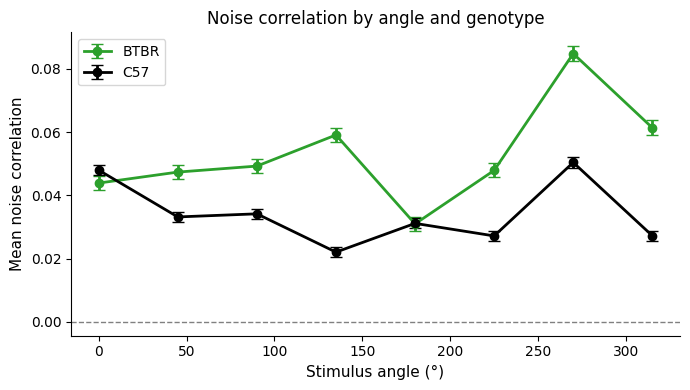

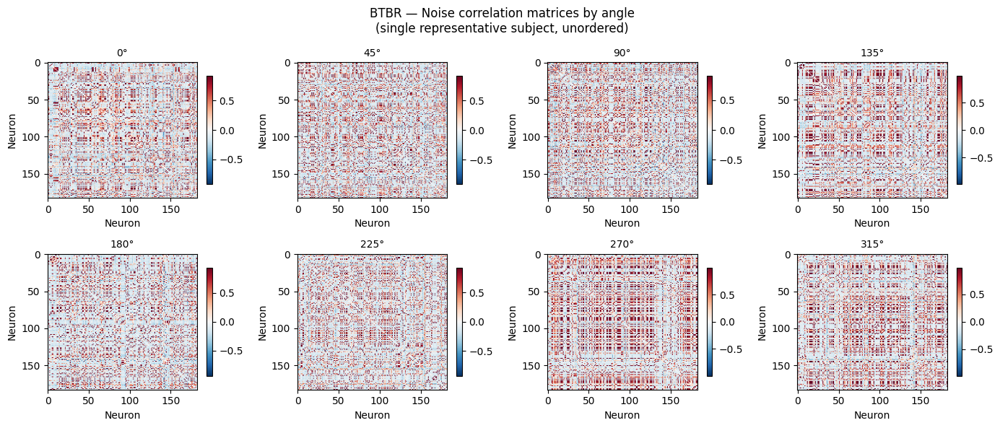

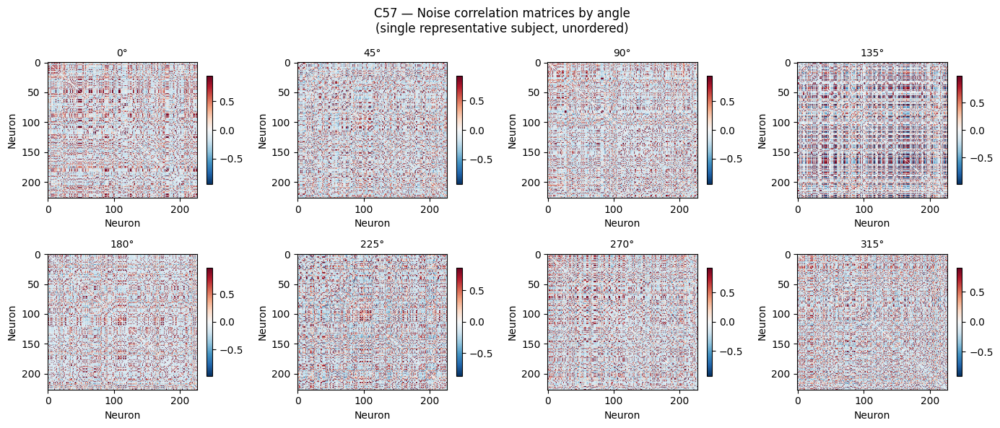


Noise correlation summary:

BTBR:
  Global mean  : 0.0531
  Median       : -0.1114
  STD          : 0.3846
  % positive   : 35.1%

C57:
  Global mean  : 0.0342
  Median       : -0.1251
  STD          : 0.3999
  % positive   : 35.4%


In [8]:
palette = {'BTBR': '#2ca02c', 'C57': '#000000', 'Unknown': '#95a5a6'}

# ── Plot 1: Mean NC by angle ───────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 4))
for geno, res in nc_results.items():
    color  = palette.get(geno, '#7f8c8d')
    angles = res['angles']
    means  = [np.mean(nc) if len(nc) else np.nan for nc in res['nc_per_angle']]
    sems   = [np.std(nc) / np.sqrt(len(nc)) if len(nc) else np.nan
              for nc in res['nc_per_angle']]
    ax.errorbar(angles, means, yerr=sems,
                label=geno, color=color,
                marker='o', capsize=4, lw=2)

ax.axhline(0, ls='--', color='gray', lw=1)
ax.set_xlabel('Stimulus angle (°)', fontsize=11)
ax.set_ylabel('Mean noise correlation', fontsize=11)
ax.set_title('Noise correlation by angle and genotype', fontsize=12)
ax.legend()
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
fig.savefig(OUTPUT_DIR / 'noise_correlation_by_angle.svg',
            format='svg', bbox_inches='tight')
plt.show()

# ── Plot 2: Global NC distribution (violin) ────────────────────────────────────
fig_v = go.Figure()
for geno, res in nc_results.items():
    color  = palette.get(geno, '#7f8c8d')
    all_nc = np.concatenate(res['nc_per_angle'])
    fig_v.add_trace(go.Violin(
        y=all_nc, name=geno,
        box_visible=True, meanline_visible=True,
        points=False,
        line_color=color
    ))
fig_v.update_layout(
    title='Global noise correlation distribution',
    yaxis_title='Noise correlation',
    template='plotly_white', width=500, height=450
)
fig_v.show()

# ── Plot 3: NC matrices by angle (one example subject per genotype) ───────────
for geno, res in nc_results.items():
    angles = res['angles']
    n_ang  = len(angles)
    n_cols = min(4, n_ang)
    n_rows = int(np.ceil(n_ang / n_cols))

    fig_m, axes = plt.subplots(n_rows, n_cols,
                                figsize=(n_cols * 3.5, n_rows * 3))
    axes = np.array(axes).flatten()

    for i, angle in enumerate(angles):
        nc_mat = res['example_matrices'].get(angle)
        if nc_mat is None:
            axes[i].set_visible(False)
            continue

        # Order neurons by preferred angle, using this subject's own
        # per-angle mean responses (no dependency on OSI/response_matrix)
        sid = res.get('example_subject_id')  # see note below
        nc_ord = nc_mat.copy()
        np.fill_diagonal(nc_ord, 0)
        vlim = np.percentile(np.abs(nc_ord), 95)
        im = axes[i].imshow(nc_ord, cmap='RdBu_r',
                             vmin=-vlim, vmax=vlim, aspect='auto')
        axes[i].set_title(f'{angle}°', fontsize=10)
        axes[i].set_xlabel('Neuron')
        axes[i].set_ylabel('Neuron')
        plt.colorbar(im, ax=axes[i], shrink=0.8)

    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    fig_m.suptitle(f'{geno} — Noise correlation matrices by angle\n'
                   f'(single representative subject, unordered)', fontsize=12)
    plt.tight_layout()
    fig_m.savefig(OUTPUT_DIR / f'{geno}_noise_correlation_matrices.svg',
                  format='svg', bbox_inches='tight')
    plt.show()

# ── Numeric summary ─────────────────────────────────────────────────────────────
print('\nNoise correlation summary:')
for geno, res in nc_results.items():
    all_nc = np.concatenate(res['nc_per_angle'])
    print(f'\n{geno}:')
    print(f'  Global mean  : {np.mean(all_nc):.4f}')
    print(f'  Median       : {np.median(all_nc):.4f}')
    print(f'  STD          : {np.std(all_nc):.4f}')
    print(f'  % positive   : {100*(all_nc > 0).mean():.1f}%')

Subject BTBR_R2_060725 (BTBR), angle 0°, 183 neurons, 10 trials
Observed mean NC : 0.0484
Null distribution: mean=0.0002, std=0.0027
Observed value falls at percentile: 100.0


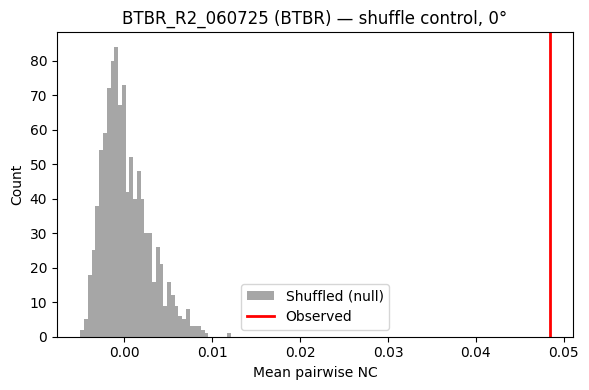

In [9]:
# ── Shuffle control — sanity check on a single subject ────────────────────────
# Validates that observed correlations exceed what pure sampling noise
# would produce, before trusting the pooled results.

test_geno  = 'BTBR'  # adjust to whichever genotype you want to inspect
test_angle = pop_data[test_geno]['angles'][0]

subject_sizes = {
    sid: pop_data[test_geno]['resp_by_subject_angle'][sid][test_angle].shape[0]
    for sid in pop_data[test_geno]['subject_ids']
}
test_sid = max(subject_sizes, key=subject_sizes.get)  # subject with most neurons

data = pop_data[test_geno]['resp_by_subject_angle'][test_sid][test_angle]
resp_per_trial = np.mean(data, axis=1)  # (N, trials)

with np.errstate(invalid='ignore'):
    real_corr = np.corrcoef(resp_per_trial)
idx_i, idx_j = np.triu_indices(real_corr.shape[0], k=1)
real_mean_nc = np.nanmean(real_corr[idx_i, idx_j])

null_dist = shuffle_control_nc(resp_per_trial, n_shuffles=1000)

print(f'Subject {test_sid} ({test_geno}), angle {test_angle}°, '
      f'{resp_per_trial.shape[0]} neurons, {resp_per_trial.shape[1]} trials')
print(f'Observed mean NC : {real_mean_nc:.4f}')
print(f'Null distribution: mean={null_dist.mean():.4f}, std={null_dist.std():.4f}')
print(f'Observed value falls at percentile: '
      f'{100 * (null_dist < real_mean_nc).mean():.1f}')

fig, ax = plt.subplots(figsize=(6, 4))
ax.hist(null_dist, bins=40, color='gray', alpha=0.7, label='Shuffled (null)')
ax.axvline(real_mean_nc, color='red', lw=2, label='Observed')
ax.set_xlabel('Mean pairwise NC')
ax.set_ylabel('Count')
ax.set_title(f'{test_sid} ({test_geno}) — shuffle control, {test_angle}°')
ax.legend()
plt.tight_layout()
plt.show()

In [10]:
def run_shuffle_controls(pop_data, n_shuffles=1000, seed=0):
    rng = np.random.default_rng(seed)
    rows = []

    for geno, pdata in pop_data.items():
        for sid in pdata['subject_ids']:
            for angle in pdata['angles']:
                data = pdata['resp_by_subject_angle'][sid][angle]  # (N, T_resp, trials)
                resp_per_trial = np.mean(data, axis=1)             # (N, trials)
                n_neurons, n_trials = resp_per_trial.shape
                if n_neurons < 2:
                    continue

                with np.errstate(invalid='ignore'):
                    real_corr = np.corrcoef(resp_per_trial)
                idx_i, idx_j = np.triu_indices(n_neurons, k=1)
                observed = np.nanmean(real_corr[idx_i, idx_j])

                null_dist = shuffle_control_nc(resp_per_trial,
                                                n_shuffles=n_shuffles, rng=rng)
                percentile = 100 * (null_dist < observed).mean()

                rows.append({
                    'genotype':      geno,
                    'subject_id':    sid,
                    'angle':         angle,
                    'n_neurons':     n_neurons,
                    'n_trials':      n_trials,
                    'observed_mean_nc': observed,
                    'null_mean':     null_dist.mean(),
                    'null_std':      null_dist.std(),
                    'percentile':    percentile,
                })

    return pd.DataFrame(rows)

shuffle_summary = run_shuffle_controls(pop_data, n_shuffles=500)
display(shuffle_summary)

,genotype,subject_id,angle,n_neurons,n_trials,observed_mean_nc,null_mean,null_std,percentile
0,BTBR,BTBR_R2_060725,0,183,10,0.048415,-0.000028,0.002649,100.0
1,BTBR,BTBR_R2_060725,45,183,10,0.048696,-0.000027,0.002510,100.0
2,BTBR,BTBR_R2_060725,90,183,10,0.056972,-0.000267,0.002457,100.0
3,BTBR,BTBR_R2_060725,135,183,10,0.083002,0.000133,0.002547,100.0
4,BTBR,BTBR_R2_060725,180,183,10,0.033927,-0.000026,0.002586,100.0
...,...,...,...,...,...,...,...,...,...
91,C57,Delta 4-22 wt,135,227,8,0.004073,-0.000032,0.002328,94.0
92,C57,Delta 4-22 wt,180,227,8,0.010378,-0.000143,0.002394,99.8
93,C57,Delta 4-22 wt,225,227,8,0.006742,-0.000112,0.002378,98.6
94,C57,Delta 4-22 wt,270,227,8,0.016563,-0.000087,0.002328,100.0


In [11]:
# Quick summary: how many subject-angle combinations show a "real" effect?
# Convention: percentile >= 97.5 or <= 2.5 (two-tailed, roughly p < 0.05)
shuffle_summary['significant'] = (
    (shuffle_summary['percentile'] >= 97.5) |
    (shuffle_summary['percentile'] <= 2.5)
)

print(shuffle_summary.groupby('genotype')['significant']
      .agg(['sum', 'count', 'mean']))

          sum  count      mean
genotype                      
BTBR       27     40  0.675000
C57        41     56  0.732143


In [12]:
# ── Build long-format dataframe of pairwise NC values ─────────────────────────
# One row per neuron pair, tagged with subject and genotype — the shared
# input for both the permutation test and the mixed-effects model.

nc_rows = []
for geno, res in nc_results.items():
    for angle, nc_vals, subj_labels in zip(res['angles'],
                                            res['nc_per_angle'],
                                            res['nc_subject_labels']):
        for val, sid in zip(nc_vals, subj_labels):
            nc_rows.append({
                'genotype':   geno,
                'subject_id': sid,
                'angle':      angle,
                'nc':         val,
            })

nc_long = pd.DataFrame(nc_rows)
print(nc_long.shape)
nc_long.head()

(733519, 4)


,genotype,subject_id,angle,nc
0,BTBR,BTBR_R2_060725,0,0.890573
1,BTBR,BTBR_R2_060725,0,-0.133080
2,BTBR,BTBR_R2_060725,0,-0.158392
3,BTBR,BTBR_R2_060725,0,-0.158392
4,BTBR,BTBR_R2_060725,0,-0.170276


Observed difference (BTBR - C57): 0.0189
Permutation p-value: 0.5204


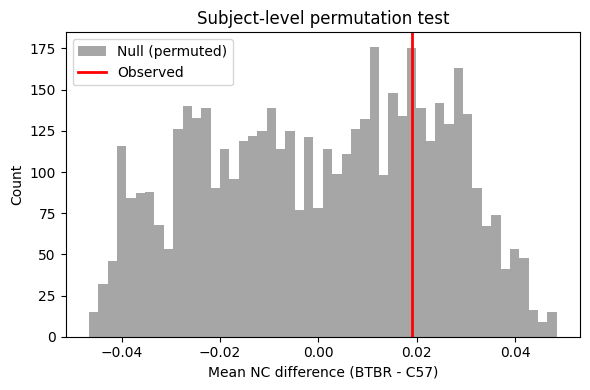

In [13]:
def permutation_test_by_subject(nc_long, n_permutations=5000, seed=0):
    """Tests whether mean NC differs between genotypes, permuting genotype
    labels at the subject level (not the pair level) to respect the fact
    that pairs within a subject are not independent observations."""
    rng = np.random.default_rng(seed)

    # One genotype label per subject (subjects don't change genotype)
    subject_geno = nc_long.groupby('subject_id')['genotype'].first()
    subjects = subject_geno.index.to_numpy()

    def group_means(labels):
        # labels: dict subject_id -> genotype, for this permutation
        merged = nc_long['subject_id'].map(labels)
        return nc_long.groupby(merged)['nc'].mean()

    observed = group_means(subject_geno.to_dict())
    observed_diff = observed.get('BTBR', np.nan) - observed.get('C57', np.nan)

    null_diffs = np.zeros(n_permutations)
    geno_values = subject_geno.to_numpy()
    for p in range(n_permutations):
        shuffled = rng.permutation(geno_values)
        shuffled_labels = dict(zip(subjects, shuffled))
        means = group_means(shuffled_labels)
        null_diffs[p] = means.get('BTBR', np.nan) - means.get('C57', np.nan)

    p_value = np.mean(np.abs(null_diffs) >= np.abs(observed_diff))

    return {
        'observed_diff': observed_diff,
        'null_diffs':    null_diffs,
        'p_value':       p_value,
    }

perm_result = permutation_test_by_subject(nc_long, n_permutations=5000)
print(f"Observed difference (BTBR - C57): {perm_result['observed_diff']:.4f}")
print(f"Permutation p-value: {perm_result['p_value']:.4f}")

fig, ax = plt.subplots(figsize=(6, 4))
ax.hist(perm_result['null_diffs'], bins=50, color='gray', alpha=0.7,
        label='Null (permuted)')
ax.axvline(perm_result['observed_diff'], color='red', lw=2, label='Observed')
ax.set_xlabel('Mean NC difference (BTBR - C57)')
ax.set_ylabel('Count')
ax.legend()
ax.set_title('Subject-level permutation test')
plt.tight_layout()
plt.show()

In [14]:
import statsmodels.formula.api as smf

# Genotype as fixed effect, subject as random effect —
# accounts for the fact that pairs are nested within subjects
mixed_model = smf.mixedlm("nc ~ genotype", data=nc_long,
                           groups=nc_long["subject_id"])
mixed_result = mixed_model.fit()
print(mixed_result.summary())

C:\Users\Propietarioi\AppData\Roaming\Python\Python310\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Propietarioi\AppData\Roaming\Python\Python310\site-packages\statsmodels\regression\mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: nc          
No. Observations: 733519  Method:             REML        
No. Groups:       12      Scale:              0.1555      
Min. group size:  1242    Log-Likelihood:     -358267.5956
Max. group size:  205208  Converged:          Yes         
Mean group size:  61126.6                                 
----------------------------------------------------------
                Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------
Intercept        0.059    0.015  3.918 0.000  0.029  0.088
genotype[T.C57] -0.018    0.020 -0.910 0.363 -0.056  0.021
Group Var        0.001    0.001                           



C:\Users\Propietarioi\AppData\Roaming\Python\Python310\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
